# Self-Driving Car Engineer Nanodegree

## Project: Build a Traffic Sign Recognition Classifier

---
## Overview
The goal of this project is to build a convolution neural network in Keras that clones a driver's behavior and predicts steering angles from images. The model I built could successfully drive around track one without leaving the road. The following animation shows how the car drives on the lake side track.

[Animation Place holder]()

My project includes the following files:

`model.py` containing the script to create and train the model  
`utils.py` containing all the utilities functions  
`drive.py` for driving the car in autonomous mode  
`model.h5` containing a trained convolution neural network  
`README.md` summarizing the results  


In [1]:
"""
Finding the correction matrix and distortion coefficients
"""

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
image_names = glob.glob('camera_cal/calibration*.jpg')
image_names.sort()

# Step through the list and search for chessboard corners
for idx, fname in enumerate(image_names):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_size = (img.shape[1], img.shape[0])
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (8,6), corners, ret)

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

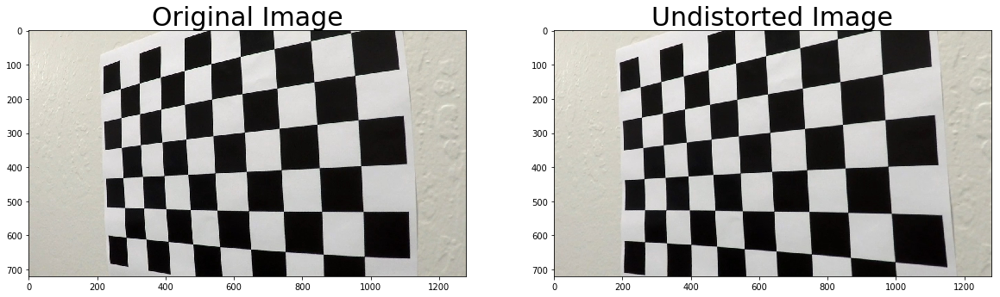

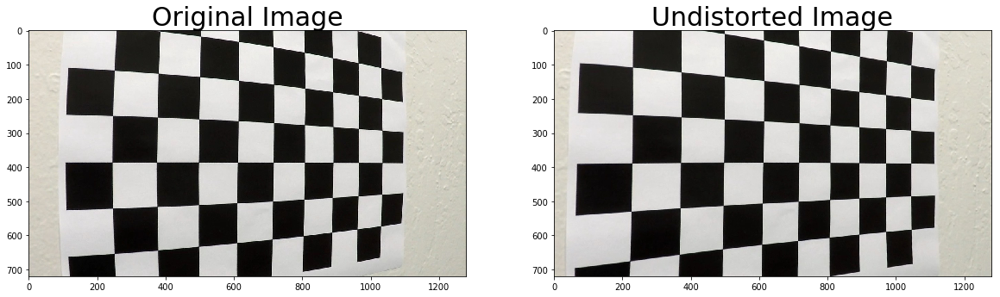

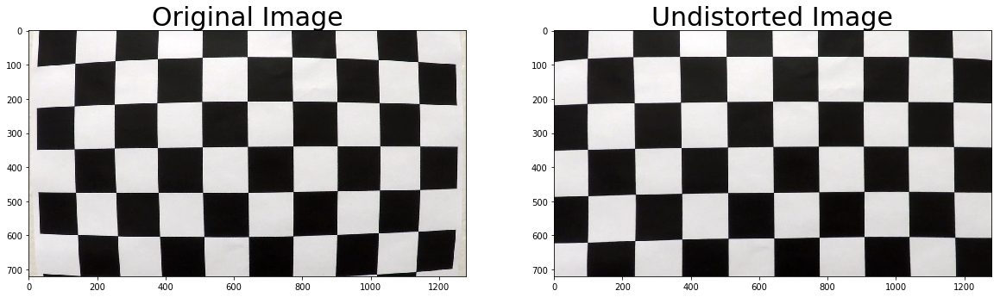

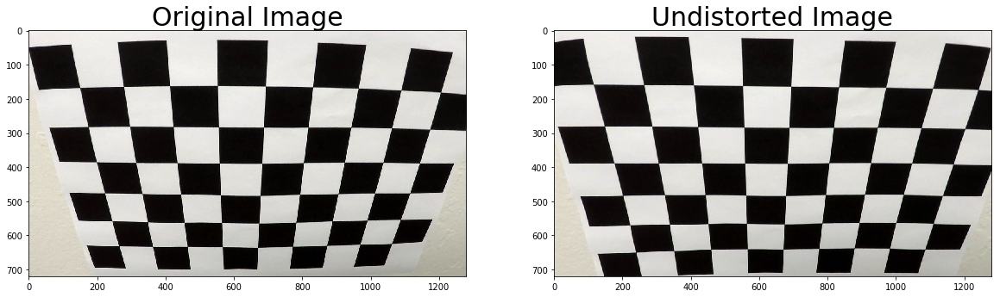

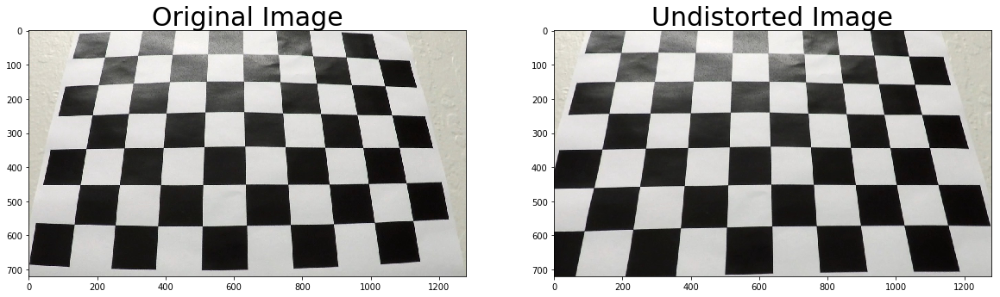

In [2]:
"""
Undistort the images
"""

import pickle
import os
%matplotlib inline

def undistort(mtx, dist, img_in_path, img_out_path='', plot=False):
    # Test undistortion on an image
    img = cv2.imread(img_in_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_size = (img.shape[1], img.shape[0])
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    if img_out_path:
        cv2.imwrite(img_out_path,dst)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=30)
    return dst

image_in_folder = 'camera_cal/'
image_out_folder = 'camera_cal_output/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
chessboard_undists = []
for file in files:
    chessboard_undists.append(undistort(mtx,dist,
                              os.path.join(image_in_folder,file),
                              os.path.join(image_out_folder,file),
                              plot=True))

In [45]:
# X,Y
img_size = (1280, 720)
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
            
# MMa 2017-06-27 Why it failed immediately when top source points are less then half of the height ??!
src = np.float32([ [img_size[0]/2-116,img_size[1]/2+150],
                    [img_size[0]/2+116,img_size[1]/2+150],
                    [img_size[0]/2+320,img_size[1]],
                    [img_size[0]/2-320,img_size[1]]])

offset_x = 300 # offset for dst points
offset_y = 400
dst = np.float32([ [offset_x, offset_y], 
                    [img_size[0]-offset_x, offset_y], 
                    [img_size[0]-offset_x, img_size[1]], 
                    [offset_x, img_size[1]]])

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)
ploty = np.linspace(0, img_size[1]-1, img_size[1]/10 )

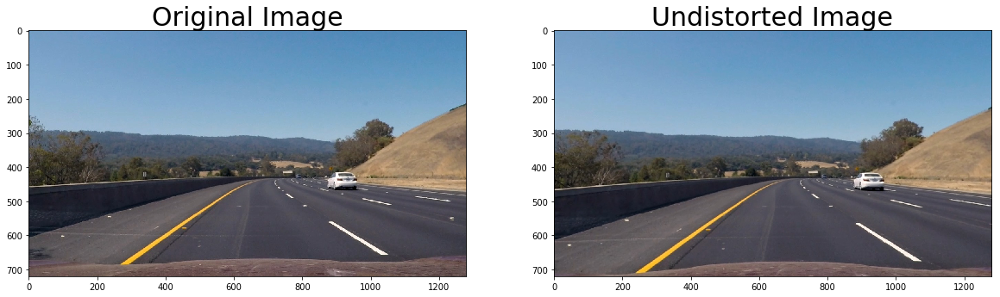

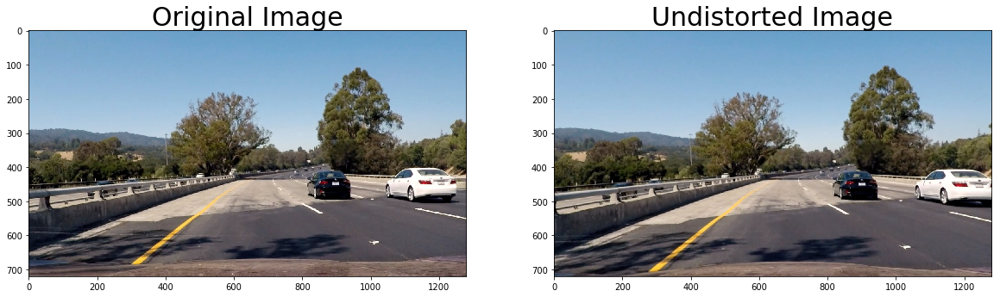

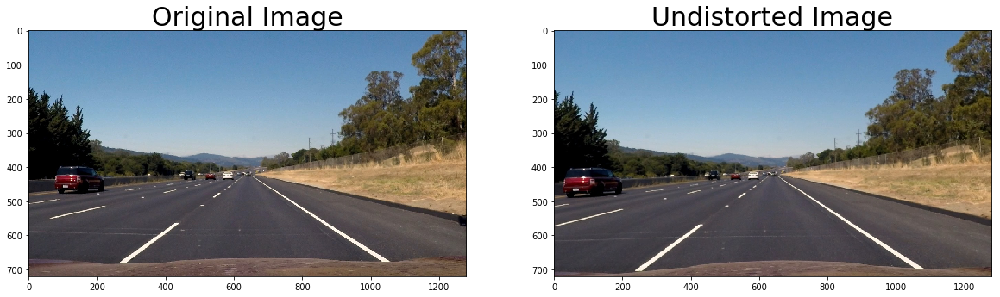

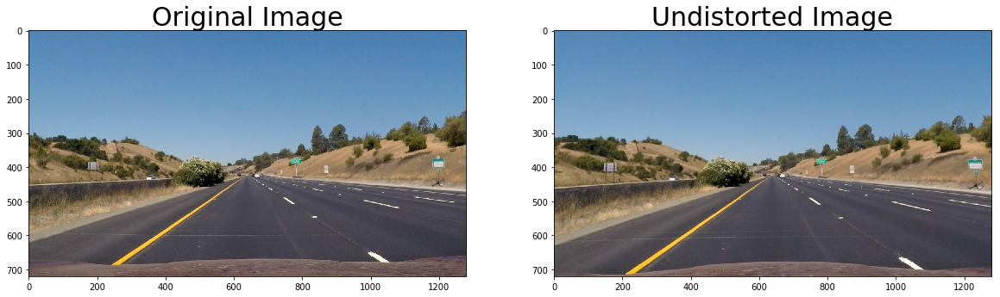

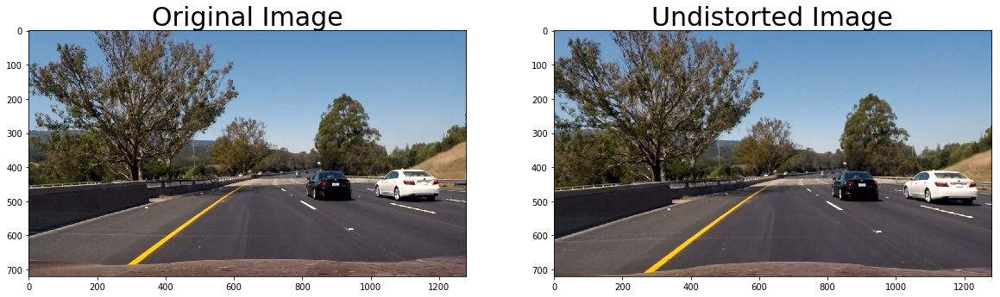

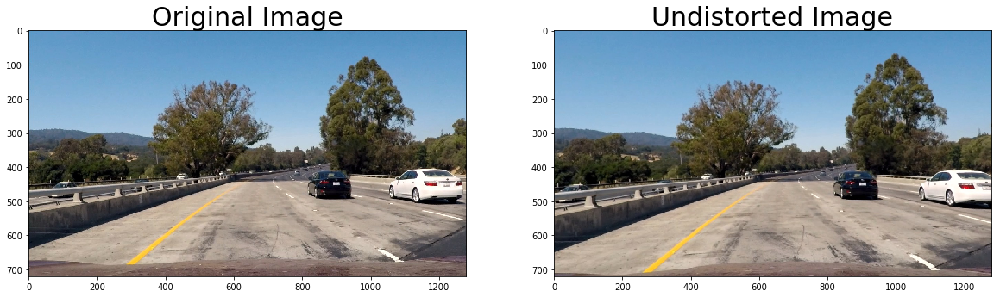

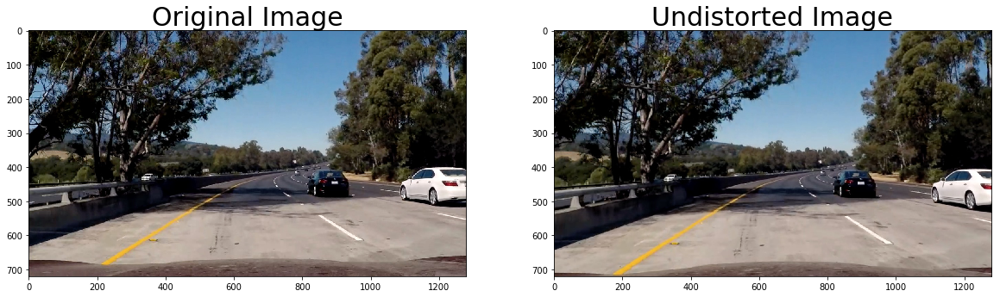

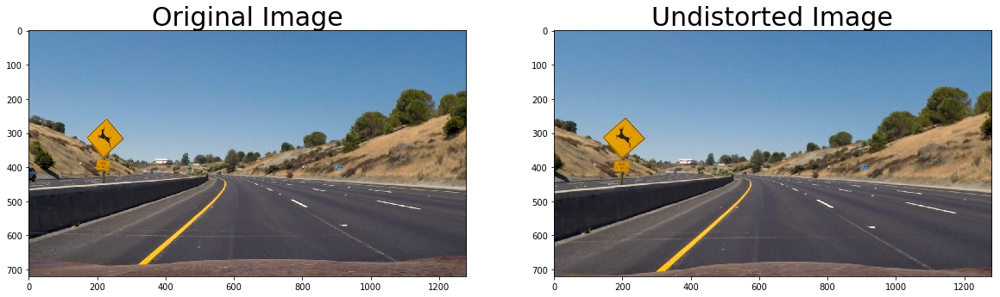

In [3]:
image_in_folder = 'test_images/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
images = []
for file in files:
    images.append(undistort(mtx,dist,
                            os.path.join(image_in_folder,file),
                            plot = True))

<function __main__.test_dir>

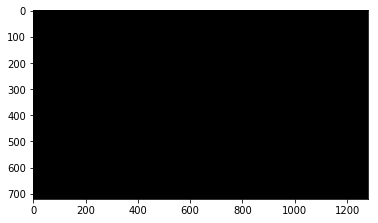

In [4]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
import utils

def test_dir(kernel_size, thresh_min, thresh_max):
    img_test = utils.gaussian_blur(images[0],9)

    dir_bin = utils.dir_thresh(img_test,kernel_size, 
                               thresh=(thresh_min, thresh_max))
    plt.imshow(dir_bin,cmap='gray')

    #dir_bin = utils.dir_thresh(img_test,15,thresh=(0.73, 1.16))
interact(test_dir,kernel_size=(1,31,2), 
         thresh_min=(0,np.pi/2,0.01), 
         thresh_max=(0,np.pi/2,0.01))

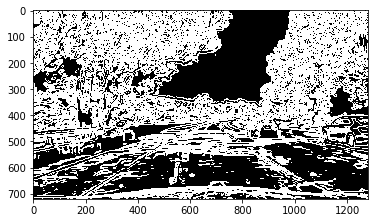

In [5]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
import utils

def test_mag(kernel_size, thresh_min, thresh_max):
    img_test = utils.gaussian_blur(images[0],9)

    mag_bin = utils.mag_thresh(img_test,kernel_size, 
                               thresh=(thresh_min, thresh_max))
    mag_bin = utils.mag_thresh(img_test,kernel_size, thresh=(8, 72))
    plt.imshow(mag_bin,cmap='gray')

interact(test_mag,kernel_size=(1,31,2), 
         thresh_min=(0,50), 
         thresh_max=(0,100))

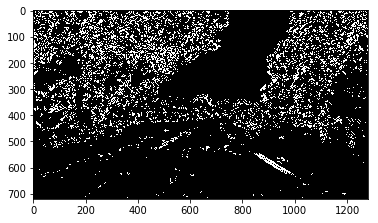

In [7]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
def test_mag_dir( mag_min_thresh, mag_max_thresh, 
                  dir_min_thresh, dir_max_thresh):
    img_test = utils.gaussian_blur(images[0],9)

    dir_bin = utils.dir_thresh(img_test, 15, thresh=(dir_min_thresh, dir_max_thresh))
    mag_bin = utils.mag_thresh(img_test, 15, thresh=(mag_min_thresh, mag_max_thresh))
    combined = np.zeros_like(dir_bin)
    combined[((dir_bin == 1) & (mag_bin == 1))] = 1
    plt.imshow(combined,cmap='gray')

interact(test_mag_dir,
         mag_min_thresh=(0,255), 
         mag_max_thresh=(0,255),
         dir_min_thresh=(0,np.pi/2,0.01), 
         dir_max_thresh=(0,np.pi/2,0.01))

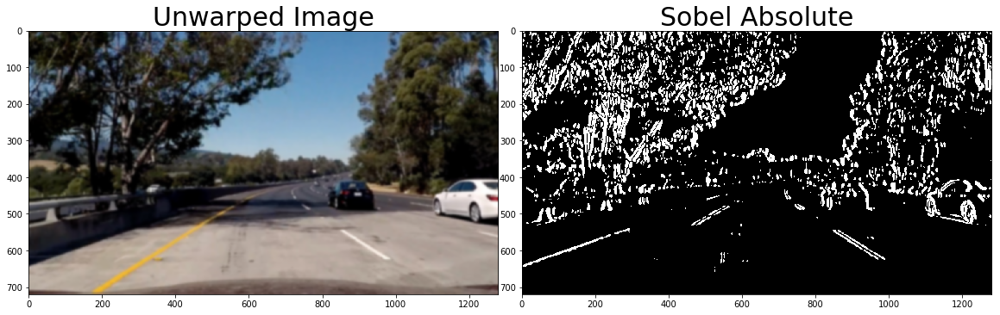

In [9]:
def test_abs_thresh(kernel_size, min_thresh, max_thresh):
    img_test = utils.gaussian_blur(images[0],kernel_size)
    test_out = utils.abs_sobel_thresh(img_test, 'x',
                                     thresh=(min_thresh, max_thresh))
    # Visualize sobel absolute threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(img_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(test_out, cmap='gray')
    ax2.set_title('Sobel Absolute', fontsize=30)
    
# kernel 9, min 18, max 255
interact(test_abs_thresh,
         kernel_size=(1,31,2),
         min_thresh=(0,100,1), 
         max_thresh=(0,255))

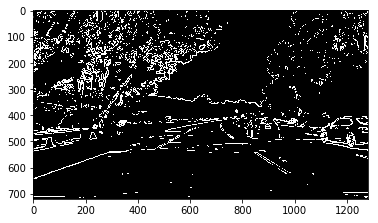

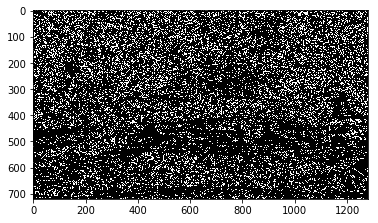

In [16]:
# for image in images:
image = images[0]
image_new = pipeline1(image)

# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(image)
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(image_new,cmap='gray')
# ax2.set_title('Processed Image', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



In [88]:
def poly_fit(img):
    print("Initial search")
    histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines

    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
#     print("left base {},right base {}".format(leftx_base,rightx_base))

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
#     print("Using window height {}".format(window_height))

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero  = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

#         # Draw the windows on the visualization image
#         cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
#         cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit,right_fit = None,None
    if lefty.any() and leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if righty.any() and rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
#     print(left_fit)
#     print(right_fit)
    return left_fit, right_fit


def poly_fit_update(img, left_fit, right_fit):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & 
                     (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & 
                        (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit,right_fit = None,None
    if lefty.any() and leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if righty.any() and rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit


def curvature(ploty,leftx,rightx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
#     print(left_fit_cr[0]*y_eval*ym_per_pix, 'm', right_fit_cr[0]*y_eval*ym_per_pix, 'm')
    return left_curverad,right_curverad

def draw_lane(img,ploty,left_fitx,right_fitx):
    img_new = img.copy()
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = warp_zero #np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (img.shape[1], img.shape[0])) 
    
    # Combine the result with the original image
    img_new = cv2.addWeighted(img_new, 1, newwarp, 0.3, 0)
    return img_new

def draw_info(img, curv_l, curv_r, dist_l,dist_r):
    img_new = np.copy(img)
    h = img_new.shape[0]
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = 'Curvature Left : {:4.2f}'.format(curv_l) + 'm'
    cv2.putText(img_new, text, (40,70), font, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Curvature right : {:4.2f}'.format(curv_r) + 'm'
    cv2.putText(img_new, text, (40,100), font, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Distance to left : {:4.2f}'.format(dist_l) + 'm'
    cv2.putText(img_new, text, (40,130), font, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Distance to left : {:4.2f}'.format(dist_r) + 'm'
    cv2.putText(img_new, text, (40,160), font, 1, (255,255,255), 2, cv2.LINE_AA)
    return img_new

def get_poly_point(poly,x):
    return poly[0]*x*x+poly[1]*x+poly[2]

In [111]:
def select(img):
    filtered = utils.gaussian_blur(img,9)
    s = utils.hls_select(filtered,thresh=(100, 255))
    
    grad_x= utils.abs_sobel_thresh(filtered, 'x',thresh=(32, 255))
    grad_y= utils.abs_sobel_thresh(filtered, 'y',thresh=(32, 255))
    
    dir_bin = utils.dir_thresh(filtered,15, thresh=(0.63, 1.))
    mag_bin = utils.mag_thresh(filtered,15, thresh=(70, 78))

    combined = np.zeros_like(mag_bin)
    combined[((grad_x == 1) ) | 
             ((mag_bin == 1) & (dir_bin == 1)) |
             s > 0] = 1
    
    return combined

def pipeline(img):
    undistort = cv2.undistort(img, mtx, dist, None, mtx)
    img_bin = select(undistort)
    warped = cv2.warpPerspective(img_bin, M, img_size, flags=cv2.INTER_LINEAR)
    
    if l_line.best_fit == None or r_line.best_fit == None:
        left_fit,right_fit = poly_fit(warped)
    else:
        left_fit,right_fit = poly_fit_update(warped,l_line.best_fit,r_line.best_fit)
     
    l_line.add_poly_fit(left_fit)
    r_line.add_poly_fit(right_fit)
    
    
    # Generate x and y values for plotting
    left_fitx = l_line.best_fit[0]*ploty**2 + l_line.best_fit[1]*ploty + l_line.best_fit[2]
    right_fitx = r_line.best_fit[0]*ploty**2 + r_line.best_fit[1]*ploty + r_line.best_fit[2]
    
    result = draw_lane(undistort,ploty,left_fitx,right_fitx)
    result = draw_info(result,l_line.radius_of_curvature,r_line.radius_of_curvature,
                       l_line.line_base_pos,r_line.line_base_pos)
    return result

# Define a class to receive the characteristics of each line detection

class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.momemtum = 0.5 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
    def add_poly_fit(self,poly_fit):
#         print("poly_fit",poly_fit)
        if poly_fit == None:
            self.detected = False
        else:
            self.detected = True
            
            if self.best_fit == None:
                self.best_fit = poly_fit
                
            self.diffs = abs(poly_fit - self.best_fit)
            if self.diffs[0] > .001 or self.diffs[1] > .5 or self.diffs[2] > 1000. :
                self.detected = False
                print("bad detection")
            else:
                self.best_fit[0] = self.best_fit[0]*(1-self.momemtum) + poly_fit[0]*self.momemtum
                self.best_fit[1] = self.best_fit[1]*(1-self.momemtum) + poly_fit[1]*self.momemtum
                self.best_fit[2] = self.best_fit[2]*(1-self.momemtum) + poly_fit[2]*self.momemtum
#                 print("self.current_fit ",self.current_fit)
    
            # Define y-value where we want radius of curvature
            # I'll choose the maximum y-value, corresponding to the bottom of the image
            y_eval = np.max(ploty)
            self.line_base_pos = abs(get_poly_point(self.best_fit, y_eval)-img_size[0]/2) * xm_per_pix

            # Calculate the new radii of curvature
            self.radius_of_curvature = ((1 +(2*self.best_fit[0]*y_eval*ym_per_pix + self.best_fit[1])**2)**1.5) / np.absolute(2*self.best_fit[0])

        

# img_bin = select(images[0])
# warped = cv2.warpPerspective(img_bin, M, img_size, flags=cv2.INTER_LINEAR)
# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(img_bin,cmap='gray')
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(warped,cmap='gray')
# ax2.set_title('Processed Image', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# plt.show()

Initial search


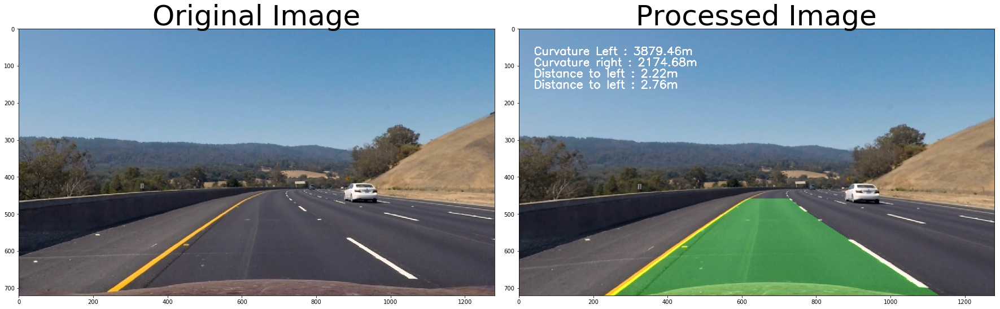

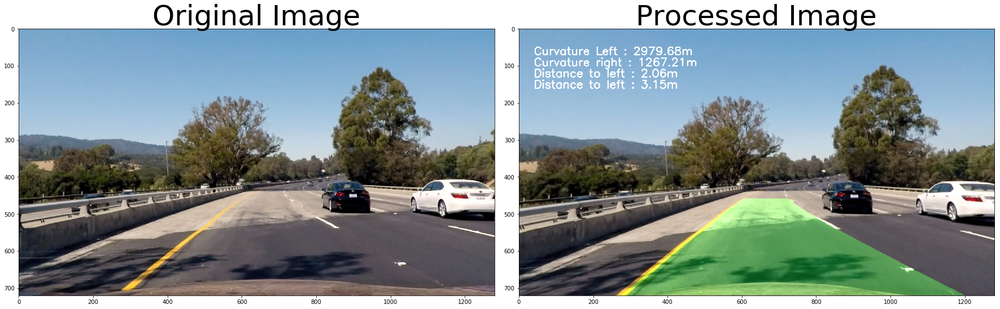

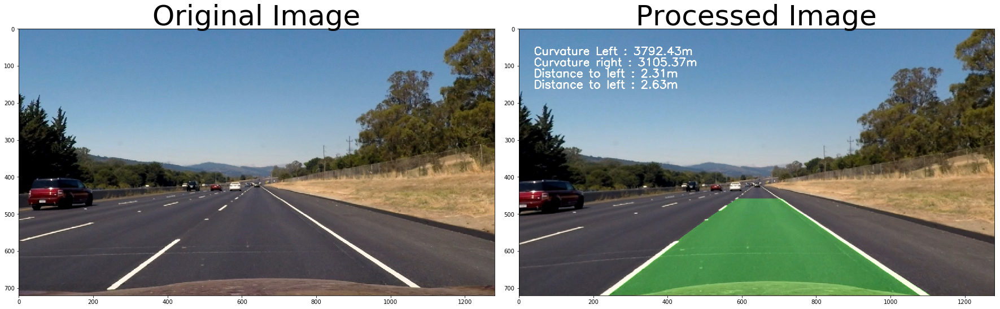

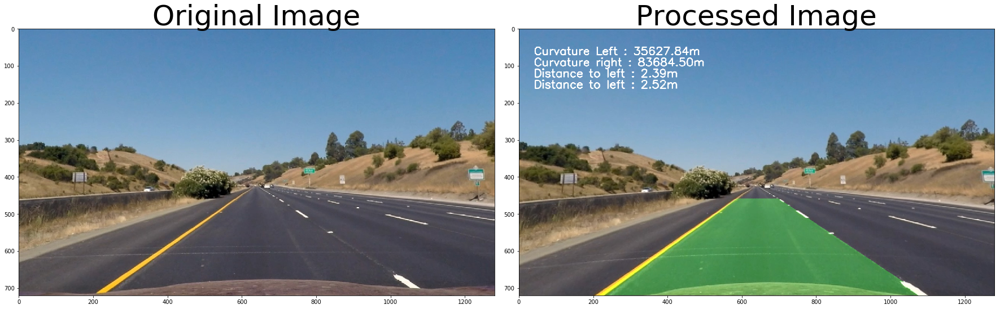

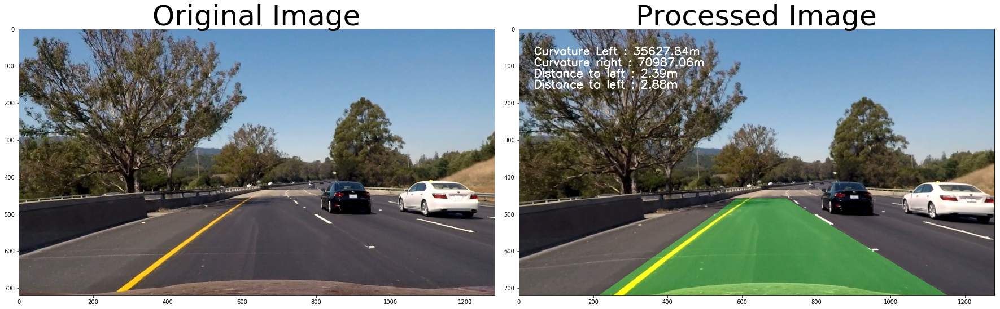

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


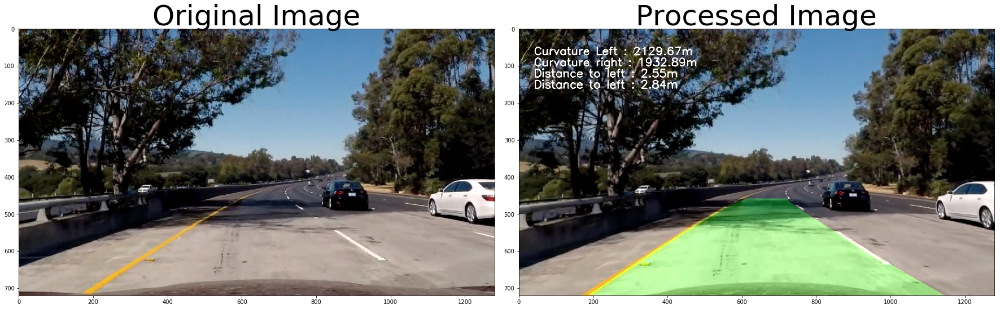

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [104]:
l_line = Line()
r_line = Line()
for image in images:
    image_new = pipeline(image)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(image_new)
    ax2.set_title('Processed Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    plt.show()

In [109]:
from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()
video_output = 'project_video_output.mp4'
video_input = VideoFileClip('project_video.mp4')
processed_video = video_input.fl_image(pipeline)
processed_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



 12%|█▏        | 152/1261 [00:53<06:28,  2.86it/s]


 24%|██▍       | 303/1261 [01:47<05:48,  2.75it/s]


 36%|███▌      | 454/1261 [02:40<04:50,  2.78it/s]


 48%|████▊     | 605/1261 [03:34<03:44,  2.93it/s]


 60%|█████▉    | 756/1261 [04:27<02:59,  2.82it/s]


 72%|███████▏  | 907/1261 [05:21<02:05,  2.82it/s]


 83%|████████▎ | 1043/1261 [06:09<01:20,  2.72it/s]

bad detection



 83%|████████▎ | 1044/1261 [06:10<01:19,  2.73it/s]

bad detection



 83%|████████▎ | 1045/1261 [06:10<01:18,  2.74it/s]

bad detection



 83%|████████▎ | 1046/1261 [06:10<01:18,  2.73it/s]

bad detection



 83%|████████▎ | 1047/1261 [06:11<01:17,  2.74it/s]

bad detection



 83%|████████▎ | 1048/1261 [06:11<01:17,  2.75it/s]

bad detection



 83%|████████▎ | 1049/1261 [06:11<01:17,  2.75it/s]

bad detection



 83%|████████▎ | 1050/1261 [06:12<01:16,  2.76it/s]

bad detection



 95%|█████████▌| 1198/1261 [07:06<00:22,  2.78it/s]


100%|█████████▉| 1260/1261 [07:28<00:00,  2.81it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 



In [106]:
"""
Test the change of ground color
"""
from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()
test_output= 'test1.mp4'
test = VideoFileClip('project_video.mp4').subclip(22,26)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)

Initial search
[MoviePy] >>>> Building video test1.mp4
[MoviePy] Writing video test1.mp4



 99%|█████████▉| 100/101 [00:35<00:00,  2.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test1.mp4 



In [113]:
"""
Test the robustness of rejecting shadows
"""

from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()
test_output = 'test2.mp4'
test = VideoFileClip('project_video.mp4').subclip(37,43)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)

bad detection
bad detection
[MoviePy] >>>> Building video test2.mp4
[MoviePy] Writing video test2.mp4



  1%|          | 1/151 [00:00<00:54,  2.75it/s]

bad detection
bad detection



  1%|▏         | 2/151 [00:00<00:54,  2.74it/s]

bad detection
bad detection



  2%|▏         | 3/151 [00:01<00:53,  2.79it/s]

bad detection
bad detection



  3%|▎         | 4/151 [00:01<00:52,  2.78it/s]

bad detection
bad detection



  3%|▎         | 5/151 [00:01<00:52,  2.76it/s]

bad detection
bad detection



  4%|▍         | 6/151 [00:02<00:51,  2.79it/s]

bad detection
bad detection



  5%|▍         | 7/151 [00:02<00:51,  2.81it/s]

bad detection
bad detection



  5%|▌         | 8/151 [00:02<00:51,  2.79it/s]

bad detection
bad detection



  6%|▌         | 9/151 [00:03<00:51,  2.75it/s]

bad detection
bad detection



  7%|▋         | 10/151 [00:03<00:50,  2.79it/s]

bad detection



  7%|▋         | 11/151 [00:03<00:50,  2.77it/s]

bad detection



  8%|▊         | 12/151 [00:04<00:49,  2.80it/s]

bad detection



  9%|▊         | 13/151 [00:04<00:49,  2.79it/s]

bad detection



  9%|▉         | 14/151 [00:05<00:49,  2.79it/s]

bad detection



 10%|▉         | 15/151 [00:05<00:48,  2.83it/s]

bad detection



 11%|█         | 16/151 [00:05<00:47,  2.83it/s]

bad detection



 11%|█▏        | 17/151 [00:06<00:47,  2.82it/s]

bad detection



 12%|█▏        | 18/151 [00:06<00:47,  2.81it/s]

bad detection



 13%|█▎        | 19/151 [00:06<00:46,  2.82it/s]

bad detection



 13%|█▎        | 20/151 [00:07<00:46,  2.81it/s]

bad detection



 14%|█▍        | 21/151 [00:07<00:46,  2.82it/s]

bad detection



 15%|█▍        | 22/151 [00:07<00:45,  2.82it/s]

bad detection



 15%|█▌        | 23/151 [00:08<00:44,  2.87it/s]

bad detection



 16%|█▌        | 24/151 [00:08<00:43,  2.93it/s]

bad detection



 17%|█▋        | 25/151 [00:08<00:42,  2.99it/s]

bad detection



 17%|█▋        | 26/151 [00:09<00:41,  3.01it/s]

bad detection



 18%|█▊        | 27/151 [00:09<00:42,  2.94it/s]

bad detection



 19%|█▊        | 28/151 [00:09<00:42,  2.90it/s]

bad detection



 19%|█▉        | 29/151 [00:10<00:42,  2.86it/s]

bad detection



 20%|█▉        | 30/151 [00:10<00:42,  2.85it/s]

bad detection



 21%|██        | 31/151 [00:10<00:42,  2.84it/s]

bad detection



 78%|███████▊  | 118/151 [00:42<00:12,  2.74it/s]

bad detection



 79%|███████▉  | 119/151 [00:42<00:11,  2.74it/s]

bad detection



 79%|███████▉  | 120/151 [00:43<00:11,  2.73it/s]

bad detection



 80%|████████  | 121/151 [00:43<00:10,  2.76it/s]

bad detection



 81%|████████  | 122/151 [00:43<00:10,  2.84it/s]

bad detection



 81%|████████▏ | 123/151 [00:44<00:09,  2.87it/s]

bad detection



 82%|████████▏ | 124/151 [00:44<00:09,  2.85it/s]

bad detection



 83%|████████▎ | 125/151 [00:44<00:09,  2.83it/s]

bad detection



 99%|█████████▉| 150/151 [00:53<00:00,  2.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test2.mp4 



In [110]:
"""
Test the straight road
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'test3.mp4'
test = VideoFileClip('project_video.mp4').subclip(15,19)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video test3.mp4
[MoviePy] Writing video test3.mp4



  7%|▋         | 7/101 [00:02<00:34,  2.76it/s]

KeyboardInterrupt: 

In [112]:
"""
Test the curve road
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'test4.mp4'
test = VideoFileClip('project_video.mp4').subclip(0,5)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video test4.mp4
[MoviePy] Writing video test4.mp4




  0%|          | 0/126 [00:00<?, ?it/s]

  1%|          | 1/126 [00:00<00:47,  2.64it/s]

  2%|▏         | 2/126 [00:00<00:47,  2.61it/s]

  2%|▏         | 3/126 [00:01<00:46,  2.65it/s]

  3%|▎         | 4/126 [00:01<00:45,  2.69it/s]

  4%|▍         | 5/126 [00:01<00:45,  2.69it/s]

  5%|▍         | 6/126 [00:02<00:43,  2.73it/s]

 99%|█████████▉| 125/126 [00:44<00:00,  2.77it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test4.mp4 

